 # Tumor classificiation using various classification methods
In this notebook, I look to classify tumors as either benign or malignant. To do so, I will apply a support vector machine, logistic regression, k-nearest neighbors, a simple neural network, and a decision tree based [boosting method](https://www.nvidia.com/en-us/glossary/data-science/xgboost/). Throughout I will leave comments explaining some design decisions I've made.

Data comes from the UCI Machine Learning Repository and can be found [here](https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic).

In [1]:
# imports
import sys
import os
import io
import re
import pandas as pd
import numpy as np
# for reproducibility
import random
random.seed(42)
np.random.seed(42)
os.environ['PYTHONHASHSEED'] = '0'
os.environ['CUDA_VISIBLE_DEVICES'] = ''
import tensorflow as tf
tf.random.set_seed(89)
# Standardization
from sklearn.preprocessing import StandardScaler
# PCA and some data visualization
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import seaborn as sns
# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
import xgboost as xgb
# Performance metrics
from sklearn import metrics
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
# Neural Network
from tensorflow import keras
from sklearn.model_selection import KFold
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers
#from keras.layers import Dropout
import warnings
# Mute warnings
warnings.filterwarnings("ignore")

In [2]:
# Specify the path to the directory you want to work with
directory_path = 'G:/Personal Proj/Binary Classification'
# Change the current working directory to the specified directory
os.chdir(directory_path)

# Data preprocessing

## Preparing data and annotations

In [3]:
data = pd.read_csv("./wdbc.data.txt",header=None,delimiter=",")
# This download does not have column names. Specifying them manually
data.columns = ['Sample_id','Diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
data.set_index('Sample_id', inplace = True)
annotations = data[['Diagnosis']]
data = data.drop('Diagnosis', axis = 1)

In [4]:
print(data.shape)
data.head()

(569, 30)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
Sample_id,,,,,,,,,,,,,,,,,,,,,
842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
print(annotations.shape)
annotations.head()

(569, 1)


,Diagnosis
Sample_id,
842302,M
842517,M
84300903,M
84348301,M
84358402,M


## Convert datasets to numpy arrays

I opting to standardize my inputs as I want to preserve the relationships between datapoints as well as be more robust to outliers. 

Additionally, I do not want PCA to depend on the scale of my variables, and I want values $\in$ [0,1] to ensure gradient descent in my neural network runs smoothly.

In [6]:
# convert from pd df to np array
X_raw = data.to_numpy()
# Standardization
scaler = StandardScaler()
scaler.fit(X_raw)
X = scaler.transform(X_raw)
del X_raw
# Change the annotation encoding - Benign = 0, Malignant = 1
annotations.loc[annotations['Diagnosis'] == "M", 'Diagnosis'] = 1
annotations.loc[annotations['Diagnosis'] == "B", 'Diagnosis'] = 0
y = annotations.to_numpy()
# set aside dataframe to store performance measurements
performance_metrics = pd.DataFrame(columns = ['Random', 'SVM', 'Logistic', 'KNN', 'Neural Network', 'XGBoost'],
                   index = ['Accuracy', 'Precision', 'Recall','F1 Score', 'AUC ROC'])

In [7]:
annotations.head()

,Diagnosis
Sample_id,
842302,1
842517,1
84300903,1
84348301,1
84358402,1


In [8]:
print(X.shape, X.dtype)
print(y.shape, y.dtype)

(569, 30) float64
(569, 1) object


In [9]:
y = y.astype(int)
y = y.ravel()
print(y.shape, y.dtype)

(569,) int32


## Preliminary data visualization

In [10]:
annotations.value_counts()

Diagnosis
0            357
1            212
dtype: int64

<AxesSubplot:xlabel='Diagnosis'>

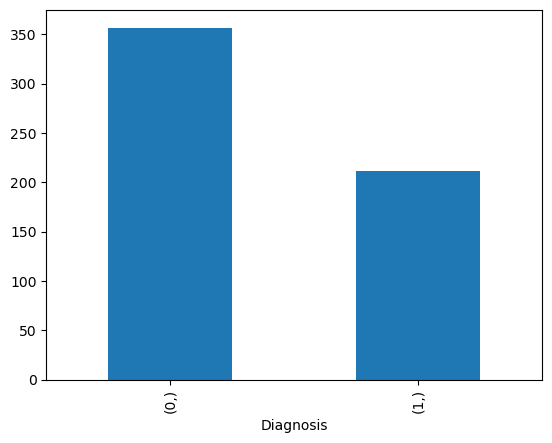

In [11]:
annotations.value_counts().plot(kind='bar')

In [12]:
# I also felt like making a function to make this plot more cleanly
def visualize_class_balance(target_vector, class_labels):
    class_counts = np.bincount(target_vector)
    num_classes = len(class_labels)

    # Plotting the class distribution
    fig, ax = plt.subplots()
    ax.bar(class_labels, class_counts)

    # Adding labels and titles
    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Samples')
    ax.set_title('Class Balance')

    # Adjusting layout
    plt.xticks(rotation='vertical')
    plt.tight_layout()

    # Displaying the plot
    plt.show()

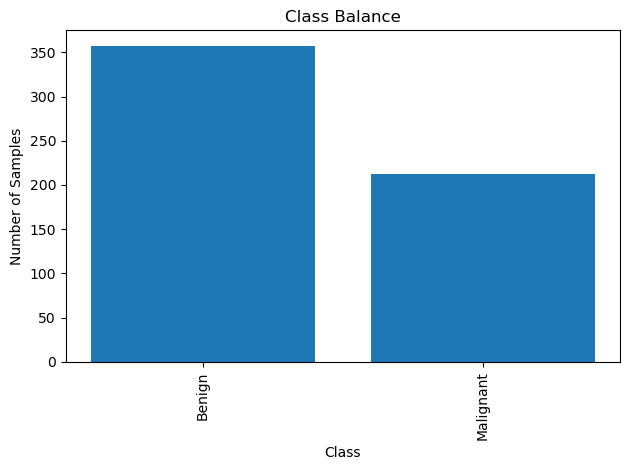

In [13]:
# call the function
class_labels = ['Benign', 'Malignant']
visualize_class_balance(y, class_labels)

Despite there being some class imbalance, I am not going to deploy any resampling techniques or generate synthetic data. While I will optimize for accuracy, I will also consider other performance metrics.

This is why I choose to apply a decision tree based boosting method, like XGBoost, that tends to perform well on imbalanced data.

## Visualize features

In [14]:
# Visualize data through PCA
pca = PCA(n_components=3)
#Transform the data
PCs = pca.fit_transform(X)
# PCA explained variance
print('PC explained variance:',pca.explained_variance_ratio_)
# Create df with principal components
PC_df = pd.DataFrame(data = PCs
             , columns = ['PC1', 'PC2', 'PC3'])
# concatenate annoations to this df
annot = annotations.loc[:, 'Diagnosis'].reset_index(drop = True)
PC_df = pd.concat([PC_df, annot], axis = 1)

PC explained variance: [0.44272026 0.18971182 0.09393163]


In [15]:
PC_df.head()

,PC1,PC2,PC3,Diagnosis
0,9.192837,1.948583,-1.123165,1
1,2.387802,-3.768171,-0.529291,1
2,5.733896,-1.075174,-0.551747,1
3,7.122953,10.275589,-3.232788,1
4,3.935302,-1.948071,1.389769,1


In [16]:
# Function to plot principal components
def plotPCA(x,y, dataframe, title):
  grouped_data = dataframe.groupby("Diagnosis")
  # Show per group
  fig, ax = plt.subplots(1)
  for i, (name, group) in enumerate(grouped_data):
      sc = ax.scatter(
          group[x],
          group[y],
          label=name,
      )
  # Add legend
  ax.add_artist(ax.legend(title='Diagnosis'))
  ax.set_title(title)
  plt.show()

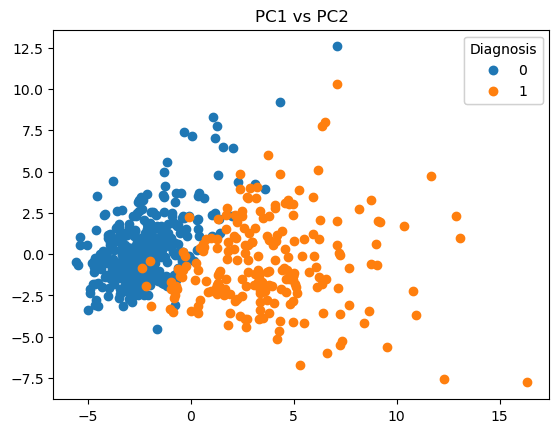

In [17]:
plotPCA(x ='PC1', y ='PC2', dataframe = PC_df, title = 'PC1 vs PC2')

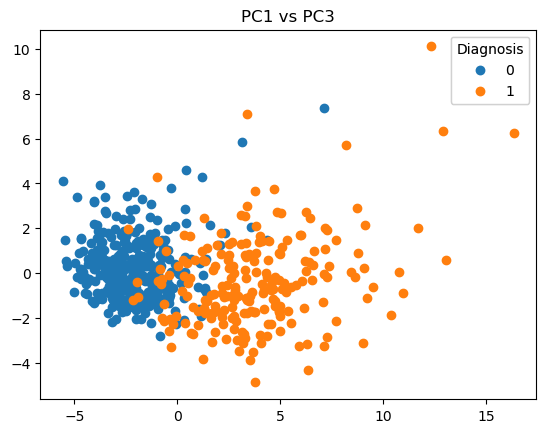

In [18]:
plotPCA(x ='PC1', y ='PC3', dataframe = PC_df, title = 'PC1 vs PC3')

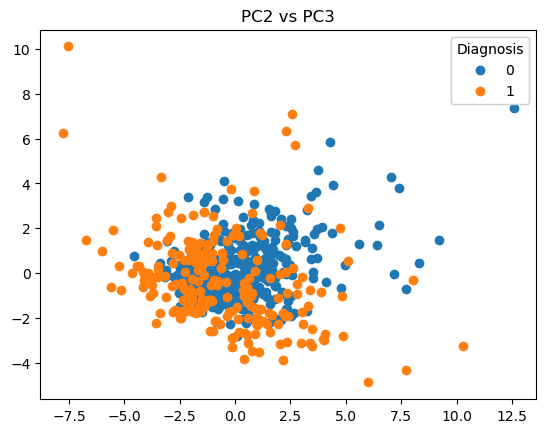

In [19]:
plotPCA(x ='PC2', y ='PC3', dataframe = PC_df, title = 'PC2 vs PC3')

## Check correlation between attributes

In [20]:
data.corr()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
fractal_dimension_mean,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.253691,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


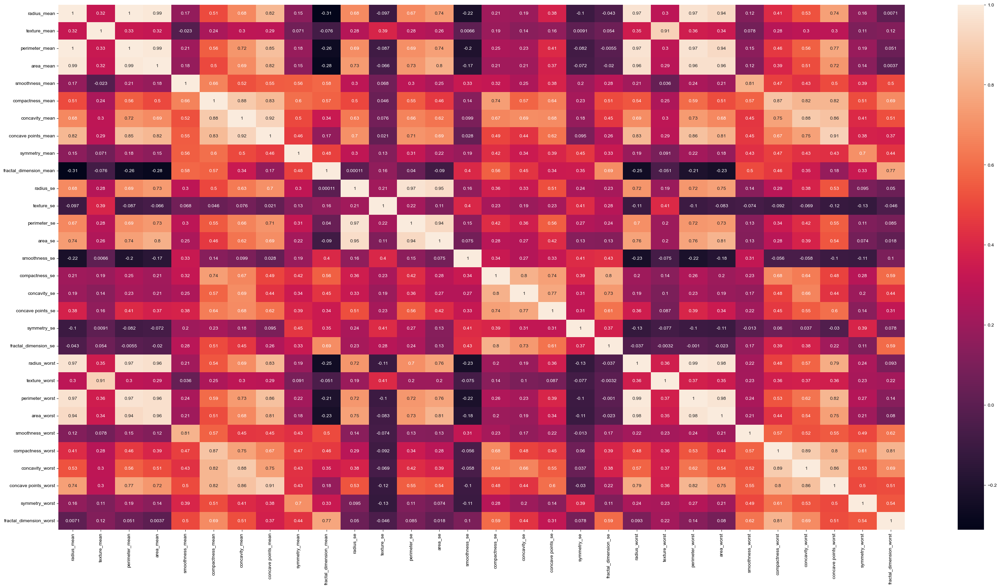

In [21]:
plt.figure(figsize=(40,20))
sns.heatmap(data.corr(), annot = True)
sns.set(font_scale=1.4)
plt.show()

We note that this dataset includes some features that are strongly correlated with each other. This is expected as intuition tells us that some features will be directly related to one another (e.g. "mean radius" is directly affected by the "worst radius").

Removing highly correlated features may improve performance and efficiency in training, but for now, I am going to leave these features untouched as there are only 30 of them.

## Pairplot

In [22]:
# pairplot wants a dataframe, so lets remake the original dataframe with the standardized values
data = pd.DataFrame(X)
data.columns = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
data = pd.concat([data, annot], axis = 1)
data.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Diagnosis
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015,1
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190,1
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391,1
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010,1
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100,1


This pair plot takes a few minutes to plot and is too small to make any meaningful insights.

In [23]:
sns.pairplot(data, hue='Diagnosis', vars=['radius_mean', 
                                          'texture_mean', 'perimeter_mean', 'area_mean', 
                                          'smoothness_mean', 'compactness_mean', 'concavity_mean', 
                                          'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 
                                          'radius_se', 'texture_se', 'perimeter_se', 'area_se', 
                                          'smoothness_se', 'compactness_se', 'concavity_se', 
                                          'concave points_se', 'symmetry_se', 'fractal_dimension_se', 
                                          'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 
                                          'compactness_worst', 'concavity_worst', 'concave points_worst', 
                                          'symmetry_worst', 'fractal_dimension_worst'], diag_kind='kde', corner = True)


Pairplot is resource intensive. I can either cut down on the number of rows/samples I let it see, or I can choose a subset of features to plot. I will do the latter, and will opt to plot only the "mean" of each feature. 

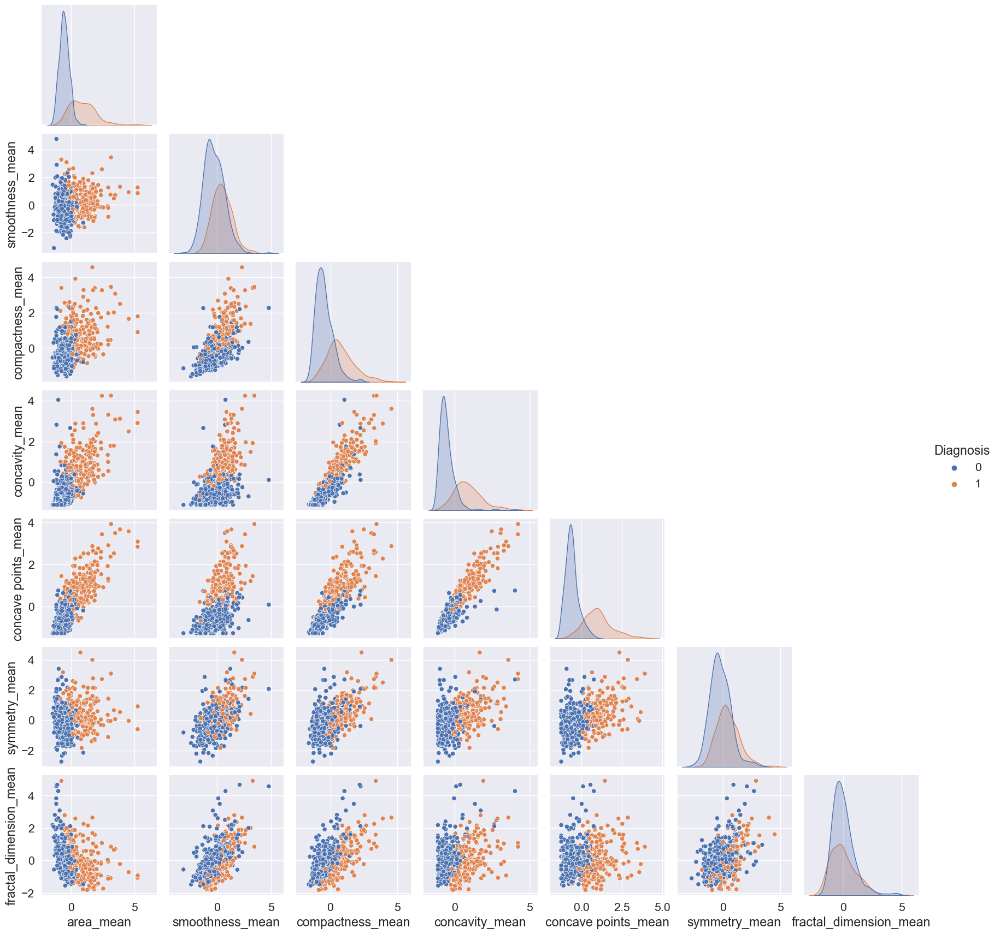

In [24]:
sns.pairplot(data, hue='Diagnosis', vars=['area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 
                                          'concave points_mean', 'symmetry_mean', 
                                          'fractal_dimension_mean'], diag_kind='kde', corner = True)

# Classifiers

## A general performance metric function

In [25]:
def performance(model, X, y_true, metric="accuracy"):
    """
    Calculates a performance metric based on the agreement between the
    true labels and the predicted labels.

    Parameters
    --------------------
        model -- a trained classifier
        X -- input data of shape (n,d)), DMatrix instance for XGBoost
        y_true -- numpy array of shape (n,), known labels
        metric -- string, option used to select the performance measure
                  options: 'accuracy', 'f1-score', 'aucroc', 'precision',
                           'sensitivity', 'specificity'

    Returns
    --------------------
        score  -- float, performance score
    """
    
    # Check for XGBoost instance, use its best iteration as our model
    if isinstance(model, xgb.core.Booster):
        y_pred = model.predict(X, iteration_range=(0, model.best_iteration + 1))
        y_pred = np.round(y_pred)
    else:
        y_pred = model.predict(X)
        y_pred = np.round(y_pred)

    if metric == "accuracy":
      return metrics.accuracy_score(y_true, y_pred)
    elif metric == "f1-score":
      return metrics.f1_score(y_true, y_pred)
    elif metric == "aucroc":
      return metrics.roc_auc_score(y_true, y_pred)
    elif metric == "precision":
      return metrics.precision_score(y_true, y_pred)
    elif (metric == "sensitivity" or metric == "recall"):
      return metrics.recall_score(y_true, y_pred)
    elif metric == "specificity":
      tn, fp, fn, tp = metrics.confusion_matrix(y_true, y_pred).ravel()
      return tn/(tn+fp)
    else: print("error, bad metric")

## Random Classifier


To establish a baseline, I first classify using a random classifier.

sklearn provides a [dummy classifier](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html), but here I implement my own Random classifier.

In [26]:
class Classifier(object) :
    """
    Classifier interface.
    """
    def fit(self, X, y):
        raise NotImplementedError()

    def predict(self, X):
        raise NotImplementedError()

In [27]:
class RandomClassifier(Classifier) :

    def __init__(self) :
        """
        A classifier that predicts according to the distribution of the classes.
        probabilities -- class distribution dict (key = class, val = probability of class)
        """
        self.probabilities = None

    def fit(self, X, y) :
        """
        Build a random classifier from the training set (X, y).

        Parameters
        --------------------
            X    -- numpy array of shape (n,d), samples
            y    -- numpy array of shape (n,), target classes

        Returns
        --------------------
            self -- an instance of self
        """
        prob_dict = dict()
        n = y.shape[0]
        count = sum(1 for i in y if i == 1)
        p = count/n
        prob_dict['1'] = p; prob_dict['0'] = 1-p
        self.probabilities = prob_dict
        return self

    def predict(self, X, seed=42) :
        """
        Predict class values.

        Parameters
        --------------------
            X    -- numpy array of shape (n,d), samples
            seed -- integer, random seed

        Returns
        --------------------
            y    -- numpy array of shape (n,), predicted classes
        """
        if self.probabilities is None :
            raise Exception("Classifier not initialized. Perform a fit first.")
        np.random.seed(seed)
        # first entry is 1, second is 0. As of Python 3.7, dicts retain insertion order
        n,d = X.shape
        y = np.random.choice([1, 0],n, p=[self.probabilities['1'], 1-self.probabilities['1']])
        return y

In [28]:
print('Classifying using Random Classifier...')
clf = RandomClassifier()       # create Random classifier
clf.fit(X, y)                  # fit training data using the classifier
accuracy = performance(clf, X, y, metric = "accuracy")

# Add metrics to dataframe
performance_metrics.loc["Accuracy","Random"] = accuracy
performance_metrics.loc["Precision","Random"] = performance(clf, X, y, metric = "precision")
performance_metrics.loc["Recall","Random"] = performance(clf, X, y, metric = "sensitivity")
performance_metrics.loc["F1 Score","Random"] = performance(clf, X, y, metric = "f1-score")
performance_metrics.loc["AUC ROC","Random"] = performance(clf, X, y, metric = "aucroc")
print('\t-- test error: %.3f' % (1-accuracy))

Classifying using Random Classifier...
	-- test error: 0.424


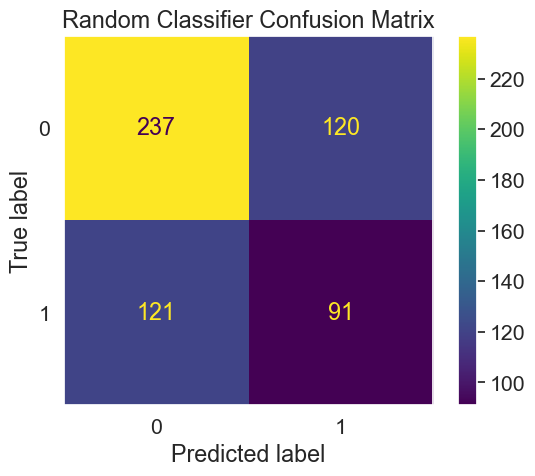

In [29]:
predictions = clf.predict(X)
cm = metrics.confusion_matrix(y, predictions, labels=np.unique(y))
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=np.unique(y))
disp.plot()
plt.grid(False)
plt.title("Random Classifier Confusion Matrix")
plt.show()

## Generate test-train split

In [30]:
X_train, X_test, y_train, y_test = train_test_split (X,y, test_size = 0.2, random_state = 42)

## SVM
We will be using a soft-margin SVM since even the PC plots are not linearly separable.

In [31]:
# Grid Search to find value of C that provides best performance
print('Classifying using SVM Classifier with grid search...')
model = LinearSVC(loss='hinge', random_state=0)
param_grid = {'C': 10.0 ** np.arange(-3, 3)} 
grid = GridSearchCV(model, param_grid, cv=5, verbose=3)
grid.fit(X_train, y_train)
best_params = grid.best_params_
print(f"Best params: {best_params}")

Classifying using SVM Classifier with grid search...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........................C=0.001;, score=0.890 total time=   0.0s
[CV 2/5] END ...........................C=0.001;, score=0.945 total time=   0.0s
[CV 3/5] END ...........................C=0.001;, score=0.956 total time=   0.0s
[CV 4/5] END ...........................C=0.001;, score=0.945 total time=   0.0s
[CV 5/5] END ...........................C=0.001;, score=0.967 total time=   0.0s
[CV 1/5] END ............................C=0.01;, score=0.989 total time=   0.0s
[CV 2/5] END ............................C=0.01;, score=0.967 total time=   0.0s
[CV 3/5] END ............................C=0.01;, score=0.989 total time=   0.0s
[CV 4/5] END ............................C=0.01;, score=0.978 total time=   0.0s
[CV 5/5] END ............................C=0.01;, score=0.956 total time=   0.0s
[CV 1/5] END .............................C=0.1;, score=0.978 total time=   0

In [32]:
print('Classifying using SVM Classifier...')
clf = LinearSVC(C = best_params['C'], loss='hinge', random_state=0) # create SVM classifier
clf.fit(X_train, y_train)                                           # fit the classifier with whole dataset
accuracy =  performance(clf, X, y, metric = "accuracy")

# Add metrics to dataframe - performance metrics on entire dataset
performance_metrics.loc["Accuracy","SVM"] = accuracy
performance_metrics.loc["Precision","SVM"] = performance(clf, X, y, metric = "precision")
performance_metrics.loc["Recall", "SVM"] =performance(clf, X, y, metric = "sensitivity")
performance_metrics.loc["F1 Score", "SVM"] = performance(clf, X, y, metric = "f1-score")
performance_metrics.loc["AUC ROC", "SVM"] = performance(clf, X, y, metric = "aucroc")
print('\t-- test error: %.3f' % (1-accuracy))

Classifying using SVM Classifier...
	-- test error: 0.021


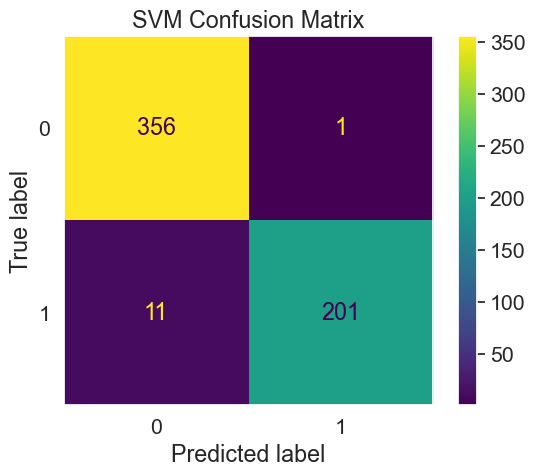

In [33]:
predictions = clf.predict(X)
cm = metrics.confusion_matrix(y, predictions, labels=clf.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.grid(False)
plt.title("SVM Confusion Matrix")
plt.show()

## Logistic Regression
Logistic Regression is a natural fit for this task as I have encoded my target vector as a binary classification of 0 (benign) and 1 (malignant).

Notes:

1.   Hyperparameter "C" is the inverse of regularization strength.
2.   liblinear is the [recommended solver for smaller datasets](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression).
3.   L2 penalty chosen to prevent overfitting. *Why am I choosing L2*?
* Based on the correlation plot above, I know some features are highly correlated.
* L1 regularization, or LASSO Regresssion, would select only 1 feature from a set of correlated freatures, arbitrarily.
* I turn to the L2 penalty, or Ridge Regression, as my preference is to avoid discounting features (I only have 30 afterall).
* Granted, an L2 penalty leaves me susceptible to outliers. However, in this context, I will not know if "outliers" are the result of biologically relevant signal, or errant measurement in data collection procedures.
* Some resources for rectifying this issue that I do not have access to with this dataset: data quality assessment (measurement error, batch effects, contamination, etc,), include biological replicates, validation experiments, functional enrichment analysis (GO or GSEA if accompanied with RNA-sequencing data), look for biological or external validation in literature.



In [34]:
print('Optimizing Logistic Regression Classifier...')
# C = 1/lambda
param_grid = [10,1,0.1]
train_errors = []; test_errors = []
for lam in param_grid:
  # Train the model
  clf = LogisticRegression(C = lam, solver = 'liblinear', penalty = 'l2', random_state=0, max_iter=1000) # create Log. Reg. classifier
  clf.fit(X_train, y_train)                  # fit training data using the classifier
  y_pred = clf.predict(X_train)              # Predict labels for
  train_error = 1 - metrics.accuracy_score(y_train, y_pred, normalize=True)
  train_errors.append(train_error)
  # Compute test/validation error
  y_pred = clf.predict(X_test)
  test_error = 1 - metrics.accuracy_score(y_test, y_pred, normalize=True)
  test_errors.append(test_error)

for i in range(3):
  print('\t-- train, test error for lambda =',param_grid[i], 'or C =', 1/param_grid[i], ':', train_errors[i], ", ", test_errors[i])

Optimizing Logistic Regression Classifier...
	-- train, test error for lambda = 10 or C = 0.1 : 0.01098901098901095 ,  0.02631578947368418
	-- train, test error for lambda = 1 or C = 1.0 : 0.01318681318681314 ,  0.02631578947368418
	-- train, test error for lambda = 0.1 or C = 10.0 : 0.01538461538461533 ,  0.00877192982456143


When C = 0.1, we have the lowest training error, but a higher test error. This may be a sign of overfitting. I will select my optimal C to be 10, which corresponds to the lowest regularization strength (as λ = $\frac{1}{C}$). This produces a moderate training error, but yields the lowest validation error.

#### Train model with optimized parameters

In [35]:
print('Classifying using Logistic Regression Classifier...')
clf = LogisticRegression(C = 10, solver = 'liblinear', penalty = 'l2', random_state=0, max_iter=1000) # create Log. Reg. classifier
clf.fit(X_train, y_train)            # fit classifier using whole dataset
accuracy =  performance(clf, X, y, metric = "accuracy")

# Add metrics to dataframe - performance metrics on entire dataset
performance_metrics.loc["Accuracy","Logistic"] = accuracy
performance_metrics.loc["Precision","Logistic"] = performance(clf, X, y, metric = "precision")
performance_metrics.loc["Recall", "Logistic"] =performance(clf, X, y, metric = "sensitivity")
performance_metrics.loc["F1 Score", "Logistic"] = performance(clf, X, y, metric = "f1-score")
performance_metrics.loc["AUC ROC", "Logistic"] = performance(clf, X, y, metric = "aucroc")
print('\t-- test error: %.3f' % (1-accuracy))

Classifying using Logistic Regression Classifier...
	-- test error: 0.014


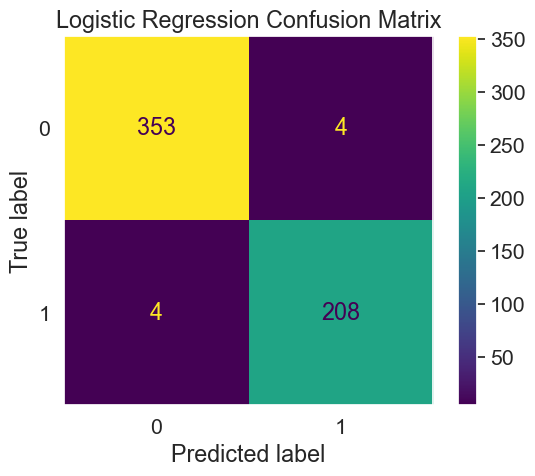

In [36]:
predictions = clf.predict(X)
cm = metrics.confusion_matrix(y, predictions, labels=clf.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.grid(False)
plt.title("Logistic Regression Confusion Matrix")
plt.show()

## K-nearest neighbors (KNN)
Since I know some features are highly correlated, my next step is to include a classifier that draws a non-linear decision boundry.

In [37]:
# Optimize for n_neighbors
test_errors = []
for k in np.arange(1,23,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    test_errors.append(1 - metrics.accuracy_score(y_test, y_pred, normalize=True))

Text(0, 0.5, 'Error Rate')

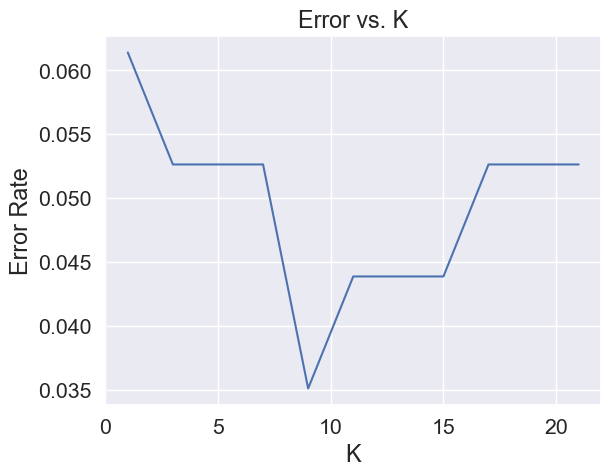

In [38]:
plt.plot(np.arange(1,23,2),test_errors)
plt.title('Error vs. K')
plt.xlabel('K')
plt.ylabel('Error Rate')

To help determine which value of k is best, I will also consider area under the ROC curve as all values of k produce error rates below 0.1.

In [39]:
#parameters for KNN
param_grid = {'n_neighbors': np.arange(1,23,2)}
clf = KNeighborsClassifier()
grid = GridSearchCV(clf, param_grid, cv=5, scoring = 'roc_auc_ovr')
grid.fit(X_train, y_train)
pred_cv = grid.best_estimator_.predict(X_test)
print('Best Value of N Neighbors:',grid.best_params_['n_neighbors'])
for l, n in zip(param_grid['n_neighbors'],grid.cv_results_['mean_test_score']):
    print(f'N Neighbors: {l}\t',f'AUC: {n}')

Best Value of N Neighbors: 21
N Neighbors: 1	 AUC: 0.9322795047733662
N Neighbors: 3	 AUC: 0.9748205337241316
N Neighbors: 5	 AUC: 0.9854849875934535
N Neighbors: 7	 AUC: 0.9861577232773987
N Neighbors: 9	 AUC: 0.9880127203496478
N Neighbors: 11	 AUC: 0.9886390325805294
N Neighbors: 13	 AUC: 0.9894104383215092
N Neighbors: 15	 AUC: 0.9887364086040289
N Neighbors: 17	 AUC: 0.9878056749840672
N Neighbors: 19	 AUC: 0.9880675550206884
N Neighbors: 21	 AUC: 0.9904901475521738


Text(0, 0.5, 'AUC ROC')

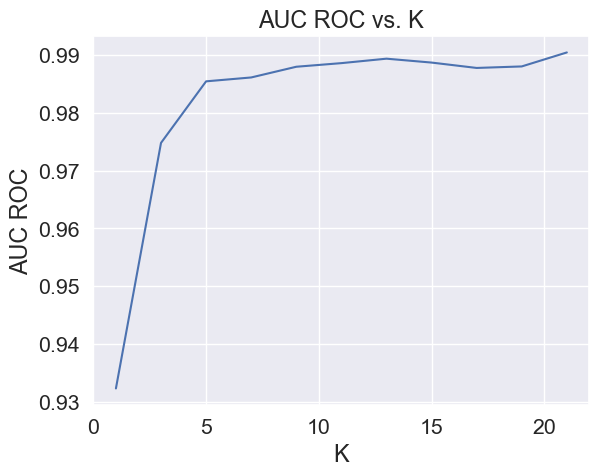

In [40]:
plt.plot(np.arange(1,23,2),grid.cv_results_['mean_test_score'])
plt.title('AUC ROC vs. K')
plt.xlabel('K')
plt.ylabel('AUC ROC')

AUC ROC alone does not tell the whole story. It is comforting to see all values of K produce hugh AUC ROC. Going forward, I will use k = 9 as my hyperparameter for KNN because this is the point where the validation error is lowest, before rising again. This behavior is a sign of overfitting.

In [41]:
print('Classifying using KNN...')
clf = KNeighborsClassifier(n_neighbors=9)       # create KNN classifier
clf.fit(X_train, y_train)           # fit data using the classifier
accuracy =  performance(clf, X, y, metric = "accuracy")

# Add metrics to dataframe - performance metrics on entire dataset
performance_metrics.loc["Accuracy","KNN"] = accuracy
performance_metrics.loc["Precision","KNN"] =performance(clf, X, y, metric = "precision")
performance_metrics.loc["Recall","KNN"] = performance(clf, X, y, metric = "sensitivity")
performance_metrics.loc["F1 Score","KNN"] = performance(clf, X, y, metric = "f1-score")
performance_metrics.loc["AUC ROC","KNN"] = performance(clf, X, y, metric = "aucroc")
print('\t-- test error: %.3f' % (1-accuracy))

Classifying using KNN...
	-- test error: 0.025


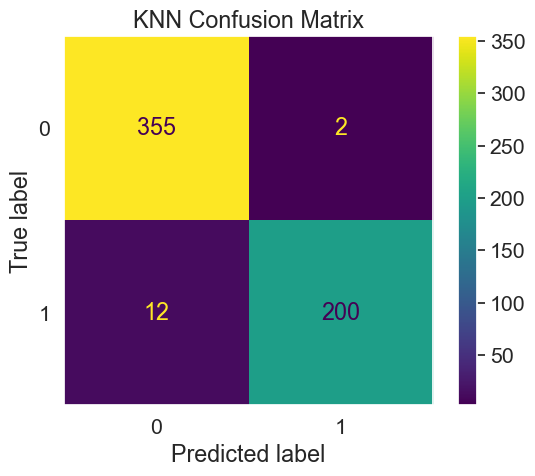

In [42]:
predictions = clf.predict(X)
cm = metrics.confusion_matrix(y, predictions, labels=clf.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.grid(False)
plt.title("KNN Confusion Matrix")
plt.show()

## Neural Network

Since GPUs are optimized to process many simultaneous calculations, we first check if a GPU is available (granted in this instance, I'm not training a large network)

In [43]:
# Check if GPU is available for training
if tf.config.list_physical_devices('GPU'):
    # Set device placement to GPU
    tf.config.set_visible_devices(tf.config.list_physical_devices('GPU'), 'GPU')
    print("GPU is available. Training on GPU.")
else:
    # Use CPU
    print("GPU is not available. Training on CPU.")

GPU is not available. Training on CPU.


Some design decisions.
<ul type="none">
  <li>As for the interface of the NN, I want to call one function and have it run the training and testing of the NN, and output the final model and accuracy for each of n test-train splits.</li>
  <li>I found overfitting to be easy with this small dataset. There were a few network design decisions taken to remedy this:</li>
    <ul>
      <li>I kept the architecture simple, with only one hidden layer. I chose a sigmoid activation function as it fits nicely with a 0/1 class prediction. However, this is moving into the realm of constructing a logistic regression out of a neural network. The difference here being that I am using a different optimizer - SGD.</li>
      <li>When considering the optimizer that would update my weights, I decided to use a stochastic gradient descent (SGD). I found the network benefited from a larger coefficient for momentum. This larger coefficient (0.7) increases the degree of "smoothing" of the gradient descent.</li>
      <li> I considered using dropouts, however with a realtively small dataset and only one hidden layer dropouts did not have much of an effect. A small L2 regularization and momentum on SGD was sufficient to handle overfitting.</li>
</ul>


In [44]:
def build_model(input_dim, output_dim):
    """
    Build a fully connected Neaural Network (Dense)

    Parameters
    ------------------------------------------------
    input_dim = number of features - ends up being 30 in this case
    output_dim = number of classes - ends up being 1 in Keras for binary classification
    """
    model = Sequential()
    model.add(tf.keras.Input(shape=input_dim))
    #model.add(Dropout(0.5))
    model.add(Dense(output_dim, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)))
    optimizer = keras.optimizers.SGD(momentum = 0.7, learning_rate=0.01)
    model.compile(loss='BinaryCrossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

def train_model(X_train, y_train, X_val, y_val, epochs=10):
    # Build the model, note for binary classification, output dim is 1
    model = build_model(np.shape(X_train)[1], 1)
    model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epochs, batch_size=32)
    return model

def cross_validate(X, y, n_splits=5, epochs=10):
    kf = KFold(n_splits=n_splits, shuffle=True)
    accuracies = []
    model = None
    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        model = train_model(X_train, y_train, X_val, y_val, epochs=epochs) # train the model
        accuracy = performance(model, X, y)  # evaluate accuracy on whole dataset
        accuracies.append(accuracy)
    return model, accuracies

In [45]:
model, accuracies = cross_validate(X, y, n_splits=3, epochs= 15)
mean_accuracy = np.mean(accuracies)

Epoch 1/15
12/12 [==============================] - 1s 16ms/step - loss: 0.5466 - accuracy: 0.7784 - val_loss: 0.3773 - val_accuracy: 0.9316
Epoch 2/15
12/12 [==============================] - 0s 4ms/step - loss: 0.3213 - accuracy: 0.9578 - val_loss: 0.2683 - val_accuracy: 0.9579
Epoch 3/15
12/12 [==============================] - 0s 4ms/step - loss: 0.2595 - accuracy: 0.9683 - val_loss: 0.2261 - val_accuracy: 0.9632
Epoch 4/15
12/12 [==============================] - 0s 4ms/step - loss: 0.2322 - accuracy: 0.9657 - val_loss: 0.2023 - val_accuracy: 0.9737
Epoch 5/15
12/12 [==============================] - 0s 3ms/step - loss: 0.2157 - accuracy: 0.9657 - val_loss: 0.1874 - val_accuracy: 0.9789
Epoch 6/15
12/12 [==============================] - 0s 4ms/step - loss: 0.2044 - accuracy: 0.9657 - val_loss: 0.1766 - val_accuracy: 0.9842
Epoch 7/15
12/12 [==============================] - 0s 3ms/step - loss: 0.1961 - accuracy: 0.9683 - val_loss: 0.1689 - val_accuracy: 0.9842
Epoch 8/15
12/12 [=

In [46]:
print("Mean test accuracy in training:", mean_accuracy)
print(accuracies)

Mean test accuracy in training: 0.9724663151728178
[0.9789103690685413, 0.9718804920913884, 0.9666080843585237]


In [47]:
# Add metrics to dataframe - performance metrics on entire dataset
performance_metrics.loc["Accuracy","Neural Network"] = performance(model, X, y, metric="accuracy")
performance_metrics.loc["Precision","Neural Network"] = performance(model, X, y, metric="precision")
performance_metrics.loc["Recall","Neural Network"] = performance(model, X, y, metric="sensitivity")
performance_metrics.loc["F1 Score","Neural Network"] = performance(model, X, y, metric="f1-score")
performance_metrics.loc["AUC ROC","Neural Network"] = performance(model, X, y, metric="aucroc")

18/18 [==============================] - 0s 1ms/step


18/18 [==============================] - 0s 1ms/step


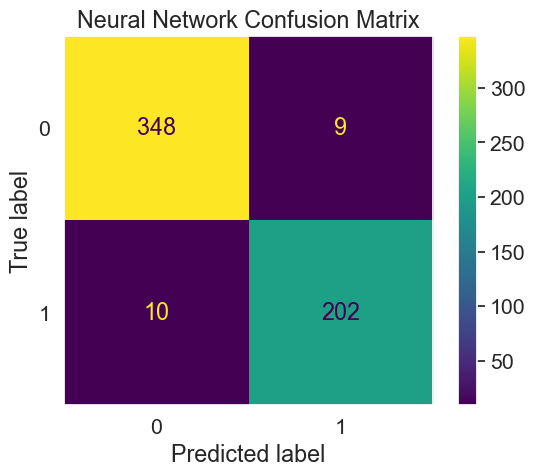

In [48]:
predictions = model.predict(X)
predictions = np.round(predictions)
cm = metrics.confusion_matrix(y, predictions, labels=np.unique(y))
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=np.unique(y))
disp.plot()
plt.grid(False)
plt.title("Neural Network Confusion Matrix")
plt.show()

## XGBoost

XGBoost documentation: https://xgboost.readthedocs.io/en/stable/python/python_intro.html

Due to concerns with overfitting, I chose to generate an ensemble with decision stumps and an L1 regularization.

## XGBoost helper functions

In [49]:
def get_xgb_updates(param, train_data, num_rounds, eval_list, stop_rounds):
    """
    Parameters
        --------------------
            param      -- XGBoost hyperparameters
            train_data -- XGBoost training data - type DMatrix
            num_rounds -- number of rounds for boosting
            eval_list  -- specified training and evaluation dataset - both type DMatrix
            stop       -- validation error must decrese at least every n stop_rounds to continue

        Returns
        --------------------
            text  -- XGBoost update text
            model -- the trained model
    """
    buffer = io.StringIO()
    original_stdout = sys.stdout
    sys.stdout = buffer

    # Train the model
    model = xgb.train(param, xgb_train, num_round, eval_list, early_stopping_rounds=stop_rounds)

    # Restore the original standard output
    sys.stdout = original_stdout
    text = buffer.getvalue()
    buffer.close()
    return text, model

def parse_xgb_IOstream(stream):
    """
    Parses XGBoost text output

    Parameters
        --------------------
            stream  -- XGBoost output text from IOstream

        Returns
        --------------------
            train_errors  -- list of the training errors
            validation  -- list of the validation errors
    """
    train_errors = []
    validation_errors = []

    text = stream.split('\n')
    for line in text:
        if line.strip():  # Skip empty lines
            segments = line.split('\t')
            train_error = float(segments[1].split(':')[1])
            validation_error = float(segments[2].split(':')[1])
            train_errors.append(train_error)
            validation_errors.append(validation_error)
    print('train errors:', train_errors)
    print('validation errors:', validation_errors)
    return train_errors, validation_errors

def plot_errors(stream):
    """
    Plot XGBoost training and validation errors

    Parameters
        --------------------
            stream  -- XGBoost output text from IOstream
    """
    train,validation = parse_xgb_IOstream(stream)
    num_round = range(len(train))

    plt.plot(num_round, train, label='Training Error')
    plt.plot(num_round, validation, label='Validation Error')

    plt.xlabel('num_round')
    plt.ylabel('Error')
    plt.title('Training and Validation Error')
    plt.legend()
    plt.grid(True)
    plt.show()

In [50]:
# Create XGBoost DMatrix instances for training, validation, and test data
xgb_train = xgb.DMatrix(data = X_train, label = y_train)
xgb_val = xgb.DMatrix(data = X_test, label = y_test)
xgb_test = xgb.DMatrix(X)

# Specify hyperparameters
param = {'max_depth': 1, 'eta': 0.7, 'objective': 'binary:logistic', 'lambda': 1}
param['nthread'] = 4
param['eval_metric'] = 'error'
param['seed'] = 0
eval_list = [(xgb_train, 'train'), (xgb_val, 'eval')]
num_round = 10

In [51]:
# Train the model
text, model= get_xgb_updates(param, xgb_train, num_round, eval_list, 3)

train errors: [0.07912, 0.07912, 0.05275, 0.04176, 0.03077, 0.02198, 0.02198]
validation errors: [0.10526, 0.10526, 0.0614, 0.0614, 0.04386, 0.04386, 0.04386]


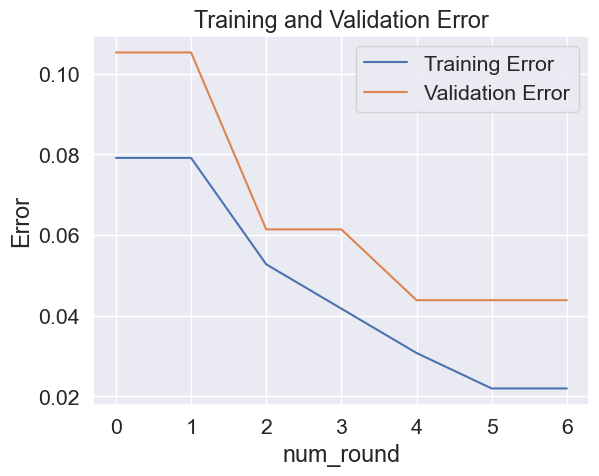

In [52]:
plot_errors(text)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

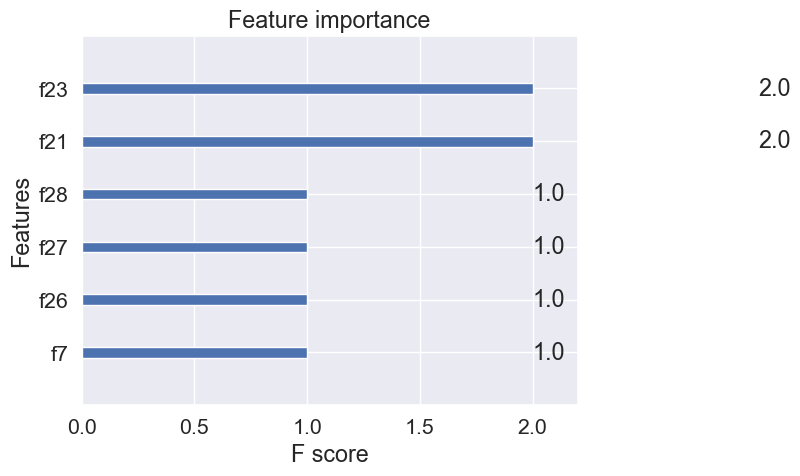

In [53]:
xgb.plot_importance(model)

In [54]:
# Add metrics to dataframe - performance metrics on entire dataset
performance_metrics.loc["Accuracy","XGBoost"] = performance(model, xgb_test, y, metric="accuracy")
performance_metrics.loc["Precision","XGBoost"] = performance(model, xgb_test, y, metric="precision")
performance_metrics.loc["Recall","XGBoost"] = performance(model, xgb_test, y, metric="sensitivity")
performance_metrics.loc["F1 Score","XGBoost"] = performance(model, xgb_test, y, metric="f1-score")
performance_metrics.loc["AUC ROC","XGBoost"] = performance(model, xgb_test, y, metric="aucroc")

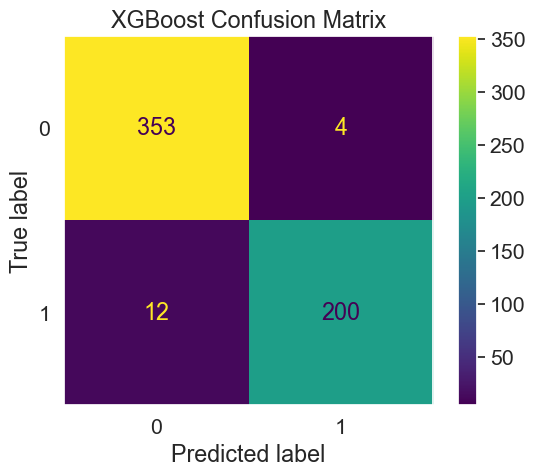

In [55]:
predictions = model.predict(xgb_test)
predictions = np.round(predictions)
cm = metrics.confusion_matrix(y, predictions, labels=np.unique(y))
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=np.unique(y))
disp.plot()
plt.grid(False)
plt.title("XGBoost Confusion Matrix")
plt.show()

# Comparing model performance on whole dataset

In [56]:
performance_metrics

,Random,SVM,Logistic,KNN,Neural Network,XGBoost
Accuracy,0.57645,0.97891,0.98594,0.975395,0.966608,0.966608
Precision,0.43128,0.99505,0.981132,0.990099,0.957346,0.966184
Recall,0.429245,0.948113,0.981132,0.943396,0.95283,0.943396
F1 Score,0.43026,0.971014,0.981132,0.966184,0.955083,0.954654
AUC ROC,0.546555,0.972656,0.984964,0.968897,0.96381,0.961894


In this example, we find that all of the classifiers had significant improvement over the Random Classifier. All of them achieved above 90% for all performance metrics, and over 96% for accuracy. However, looking at accuracy can be misleading for imbalanced datasets. All classifiers have an F1-score above 95%, which speaks towards their generally good performance despite some imbalance.

In the setting of predicting benign versus malginant tumors, we may care most about specificity and sensitivity (recall). The more sensitive our classifier, the more likely a sample the classifier predicts as benign is truly benign. Similarly, the more specific our classifier, the more likely a sample classified as malignant will actually be malignant. With this consideration SVM and KNN were the most precise, while the logistic regression was the most sensitive. 